<a href="https://colab.research.google.com/github/Chinwe-MC/Brain_tumor_detection/blob/main/Brain_tumor_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone


Cloning into 'yolov5'...
remote: Enumerating objects: 16517, done.
remote: Counting objects: 100% (115/115), done.
remote: Compressing objects: 100% (99/99), done.
remote: Total 16517 (delta 47), reused 50 (delta 16), pack-reused 16402
Receiving objects: 100% (16517/16517), 15.17 MiB | 15.77 MiB/s, done.
Resolving deltas: 100% (11304/11304), done.


In [2]:
%cd yolov5


/content/yolov5


In [3]:

%pip install -qr requirements.txt  # install

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 721.2/721.2 kB 42.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.8 MB/s eta 0:00:00


In [4]:
%pip install -q roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.4/71.4 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.0 MB/s eta 0:00:00


In [5]:
import torch
import os
from IPython.display import Image, clear_output

In [6]:
from roboflow import Roboflow



In [7]:
#create folder
os.environ["DATASET_DIRECTORY"]="/content/datasets"


# **ROBOFLOW CREDENTIALS**

In [8]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="0n7sHU0facYvsgG3OhAY")
project = rf.workspace("object-detection-mbnp4").project("tmor")
version = project.version(4)
dataset = version.download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/Tmor-4 in yolov5pytorch:: 100%|██████████| 882/882 [00:00<00:00, 7933.83it/s]


TRAIN THE MODEL

In [9]:
!python train.py --img 416 --epochs 100 --data {dataset.location}/data.yaml --weights /content/yolov5s.pt --batch-size 16


2024-03-12 11:25:30.576778: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-12 11:25:30.576855: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-12 11:25:30.578214: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=/content/yolov5s.pt, cfg=, data=/content/datasets/Tmor-4/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_s

In [10]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [12]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.2 --source /content/datasets/Tmor-4/valid/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/Tmor-4/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-294-gdb125a20 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/86 /content/datasets/Tmor-4/valid/images/2_jpg.rf.df7e54364c023307ab8eb26f373c1320.jpg: 416x416 1 no_tumor, 7.0ms
image 2/86 /content/datasets/Tmor-4/valid/images/7_jpg.rf.7c0197f1cd9c6b2d022934bd6c7e1ca4.jpg: 416x416 1 no_tumor, 7.1ms
image 3/86

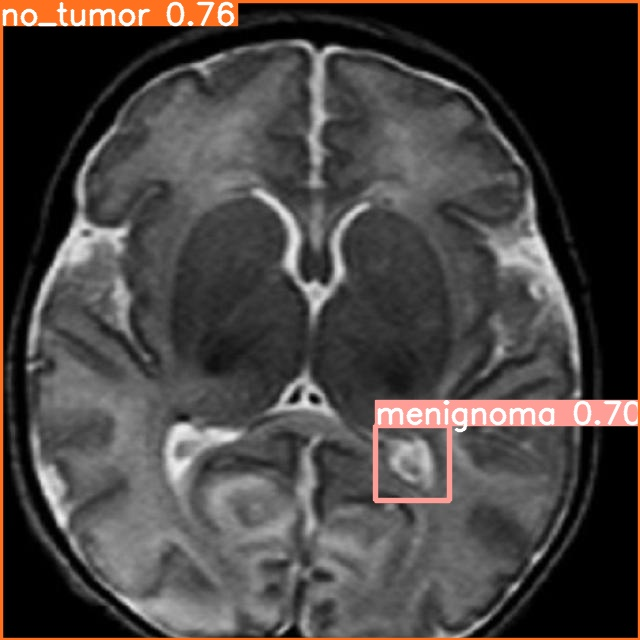

/n


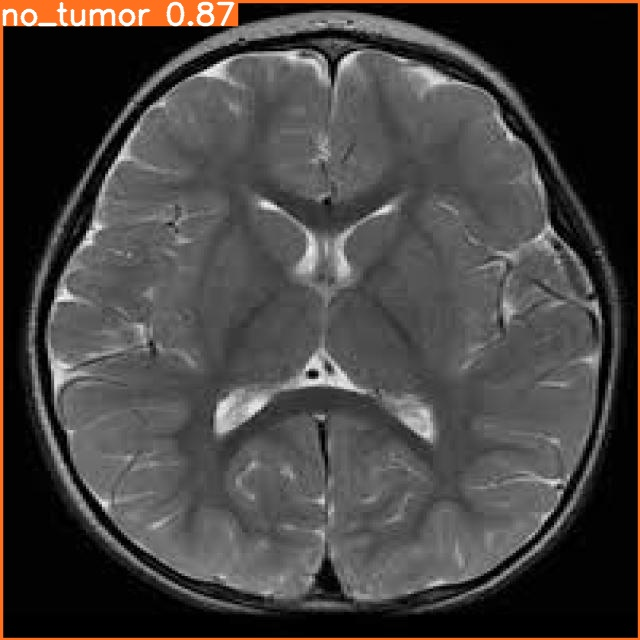

/n


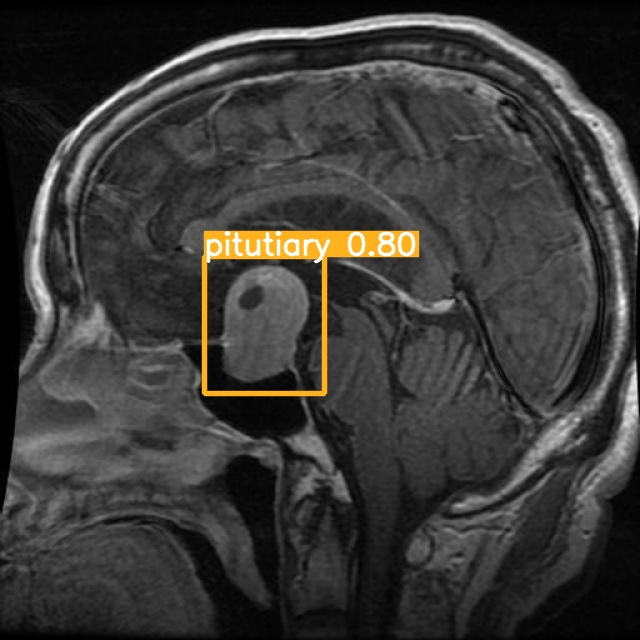

/n


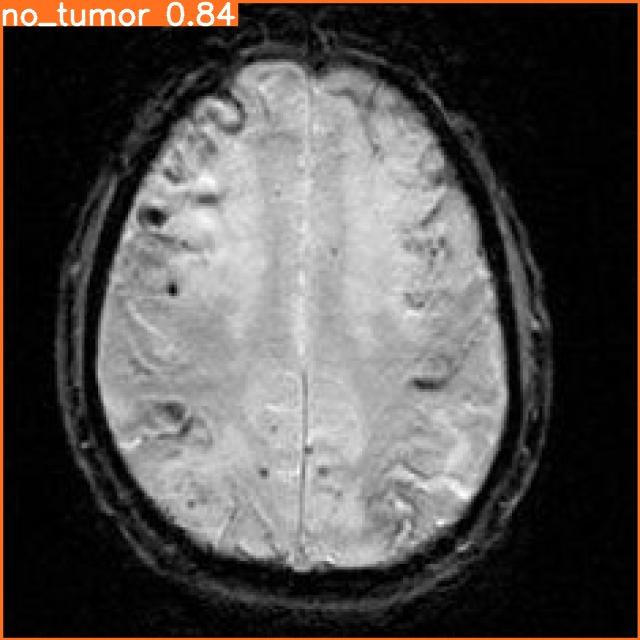

/n


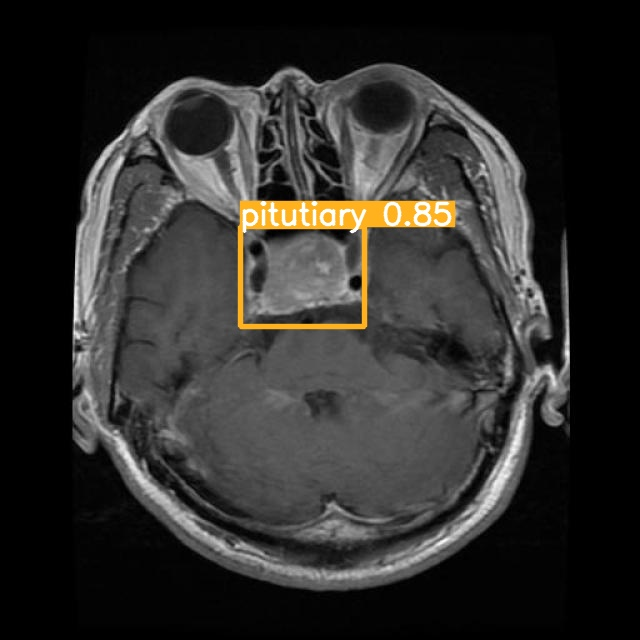

/n


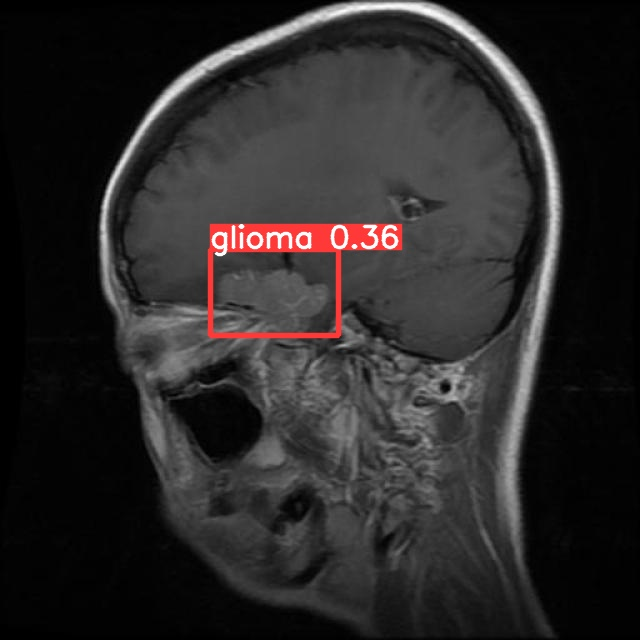

/n


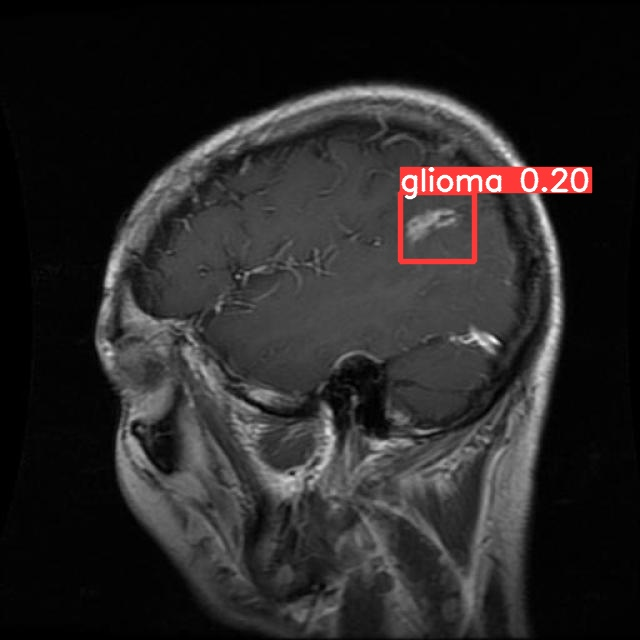

/n


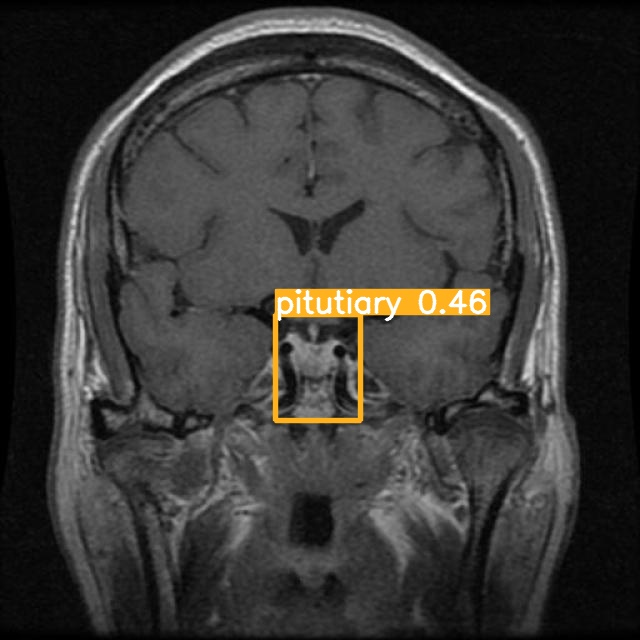

/n


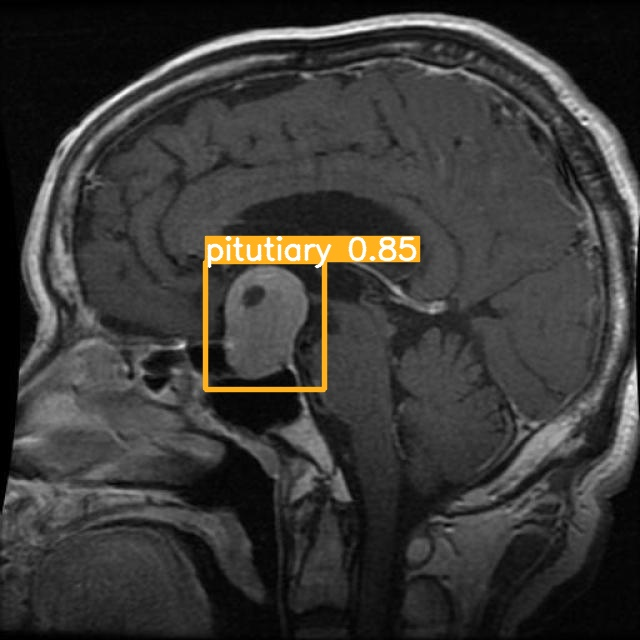

/n


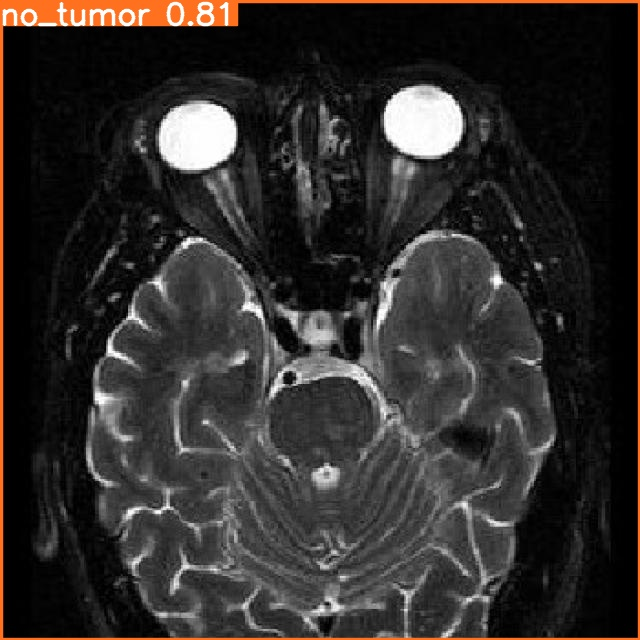

/n


In [13]:
import glob
from IPython.display import Image, display
i=0
for ImageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
  i+=1
  if i <= 10:
    display(Image(filename=ImageName))
    print('/n')